In [1]:
%pip install -q uproot
%pip install -q awkward-pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.8/395.8 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 919.6/919.6 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 656.7/656.7 kB 16.5 MB/s eta 0:00:00


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import uproot
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from torch.nn.utils import clip_grad_norm_, weight_norm
import random
import gc
import torch.nn.functional as F
from IPython.display import clear_output
from tqdm.notebook import tqdm as tqdm
import sys
import copy
import polars as pl
import copy
from scipy import stats
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import euclidean
from sklearn.neighbors import KernelDensity
from scipy.integrate import simpson

In [4]:
seed = 0xDEAD

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

set_seed(seed)

In [ ]:
N = 2112
P = 2212
pion_masses = {211: 0.13957039, -211: 0.13957039, 111: 0.1349768}
pions = [111, -211, 211]
directions = ['x', 'y', 'z']
nucleons = [N, P]
label_to_num = {col: i for i, col in enumerate(pions)}
num_to_label = {v: k for k, v in label_to_num.items()}


def calc_s_nn(row, mass_number = 131):
    '''
    параметр назван как s_nn, но по факту это инвариантная масса на нуклон
    '''
    energy = np.sum(row['fParticles.fE'])
    px = np.sum(row['fParticles.fPx'])
    py = np.sum(row['fParticles.fPy'])
    pz = np.sum(row['fParticles.fPz'])
    M_inv = np.sqrt(np.maximum(0, energy ** 2 - (px ** 2 + py ** 2 + pz ** 2)))
    return M_inv / mass_number


def select_particles(row, target_col, mask_cols):
    '''
    отбор частиц по маске
    '''
    feature_arr = np.array(row[target_col])
    mask_arr = np.zeros_like(feature_arr)
    for col in mask_cols:
        mask_arr += row[col]
    return feature_arr[mask_arr.astype(bool)]


def calc_pseudorapidity(px=None, py=None, pz=None, eps=1e-5):
    '''
    псевдобыстрота
    '''
    norm = np.sqrt(px ** 2 + py ** 2 + pz ** 2)
    return 0.5 * np.log(eps + (norm + pz) / (eps + norm - pz))


def calc_pT(px, py):
    '''
    поперечный импульс
    '''
    return np.sqrt(px ** 2 + py ** 2)


def calc_flows(px, py, weights=None):
    '''
    потоки
    '''
    phi = np.arctan2(py, px)
    n = len(phi)
    w = np.ones(n) if weights is None else weights
    Q1 = np.sum(w * np.exp(1j * phi))
    Q2 = np.sum(w * np.exp(2j * phi))
    Q3 = np.sum(w * np.exp(3j * phi))
    v1 = np.abs(Q1) / np.sum(w)
    v2 = np.abs(Q2) / np.sum(w)
    v3 = np.abs(Q3) / np.sum(w)
    return v1, v2, v3


def get_nucleons_by_type(px, py, pz, part_type='spectators', threshold=2.):
    '''
    разделение на спектаторы и партисипанты по порогу псевдобыстроты
    '''
    eta = calc_pseudorapidity(px, py, pz)
    if part_type == 'spectators':
        return eta > threshold
    else:
        return eta <= threshold


def get_part_spec(row, target_col, part_type='spectators'):
    '''
    отбор признаков для спектаторов и партисипант
    '''
    nucleon_mask = np.array(row[N]) | np.array(row[P])
    nucleon_indices = np.where(nucleon_mask)[0]
    px = np.array(row['fParticles.fPx'])[nucleon_indices]
    py = np.array(row['fParticles.fPy'])[nucleon_indices]
    pz = np.array(row['fParticles.fPz'])[nucleon_indices]
    type_mask = get_nucleons_by_type(px, py, pz, part_type)
    selected_indices = nucleon_indices[type_mask]
    return np.array(row[target_col])[selected_indices]


def get_final_moms(mom_x, mom_y, mom_z, energy, max_size):
    '''
    обработка цеелвых импульсов (паддинги и обрезка)
    '''
    if mom_x.shape[0] >= max_size:
        mask = np.ones(max_size, dtype=float)
        mom_x = mom_x[:max_size]
        mom_y = mom_y[:max_size]
        mom_z = mom_z[:max_size]
        energy = energy[:max_size]
        mom_merged = np.vstack((mom_x, mom_y, mom_z, energy)).T
    else:
        mask = np.zeros(max_size)
        mask[:len(mom_x)] = 1.0
        zeros_x = np.zeros(max_size)
        zeros_x[:len(mom_x)] = mom_x
        zeros_y = np.zeros(max_size)
        zeros_y[:len(mom_y)] = mom_y
        zeros_z = np.zeros(max_size)
        zeros_z[:len(mom_z)] = mom_z
        zeros_e = np.zeros(max_size)
        zeros_e[:len(energy)] = energy
        mom_merged = np.vstack((zeros_x, zeros_y, zeros_z, zeros_e)).T
    return mom_merged, mask


def preprocess_urqmd(urqmd, max_size_t=80, max_size_c=250):
    '''
    неэффективная фнукция предобработки с кучей ворнингов
    (по сути, считаются функции выше)

    на выходе получаем столбцы признаков событий, столбцы массивов нуклонов и столбцы массивов остальных частиц
    '''
    urqmd['s_nn'] = urqmd.apply(calc_s_nn, axis=1)
    particles = pions + [N, P]
    for p in particles:
        urqmd[p] = urqmd['fParticles.fPdg'].apply(lambda x: np.array(x) == p)
    #urqmd['nuclei'] = urqmd['fParticles.fPdg'] >= NUCLEI
    urqmd_new = pd.DataFrame()
    for d in directions:
        urqmd_new[f'mom_{d}'] = urqmd.apply(lambda x: select_particles(x, f'fParticles.fP{d}', nucleons), axis=1)
        urqmd_new[f'coord_{d}'] = urqmd.apply(lambda x: select_particles(x, f'fParticles.f{d.upper()}', nucleons), axis=1)
        urqmd_new[f'mom_part_{d}'] = urqmd.apply(lambda x: get_part_spec(x, f'fParticles.fP{d}', 'participants'), axis=1)
        urqmd_new[f'coord_part_{d}'] = urqmd.apply(lambda x: get_part_spec(x, f'fParticles.f{d.upper()}', 'participants'), axis=1)
    if 'fB' in urqmd.columns:
        urqmd_new['B'] = urqmd['fB']
    if 's_nn' in urqmd.columns:
        urqmd_new['s_nn'] = urqmd['s_nn']
    urqmd.drop(['fB', 's_nn'], errors='ignore', axis=1, inplace=True)
    urqmd_new[f'energy_part'] = urqmd.apply(lambda x: get_part_spec(x, f'fParticles.fE', 'participants'), axis=1)
    urqmd_new['energy'] = urqmd.apply(lambda x: select_particles(x, 'fParticles.fE', nucleons), axis=1)
    urqmd_new['mom_norm'] = urqmd_new.apply(lambda x: np.sqrt(x['mom_x'] ** 2 + x['mom_y'] ** 2 + x['mom_z'] ** 2), axis=1)
    urqmd_new['pseudorapidity'] = urqmd_new.apply(lambda x: calc_pseudorapidity(px=x["mom_x"], py=x["mom_y"], pz=x["mom_z"]), axis=1)
    urqmd_new['pseudorapidity_part'] = urqmd_new.apply(lambda x: calc_pseudorapidity(px=x["mom_part_x"], py=x["mom_part_y"], pz=x["mom_part_z"]), axis=1)
    urqmd_new['mom_T_part'] = urqmd_new.apply(lambda x: calc_pT(x["mom_part_x"], x["mom_part_y"]), axis=1)
    flows = urqmd_new.apply(lambda x: calc_flows(x['mom_part_x'], x['mom_part_y']), axis=1, result_type='expand')
    urqmd_new['v1'] = flows[0]
    urqmd_new['v2'] = flows[1]
    urqmd_new['v3'] = flows[2]
    urqmd_new['sum_mom'] = urqmd_new.apply(lambda x: np.sqrt(np.sum(x['mom_x']) ** 2 + np.sum(x['mom_y']) ** 2), axis=1)
    urqmd_new['rms_mom_T'] = urqmd_new.apply(lambda x: np.sqrt(np.mean(x['mom_x'] ** 2 + x['mom_y'] ** 2)), axis=1)
    urqmd_new['n_p_ratio'] = urqmd.apply(lambda x: np.sum(x[N]) / np.sum(x[P]), axis=1)
    list_cols = ['mom_x',
                 'mom_y',
                 'mom_z',
                 'mom_part_x',
                 'mom_part_y',
                 'mom_part_z',
                 'mom_T_part',
                 'coord_x',
                 'coord_y',
                 'coord_z',
                 'coord_part_x',
                 'coord_part_y',
                 'coord_part_z',
                 'energy_part',
                 'mom_norm',
                 'pseudorapidity_part',
                 'pseudorapidity']
    percentiles = [0.5]
    for col in list_cols:
        urqmd_new[f'{col}_mean'] = urqmd_new[col].apply(np.mean)
        urqmd_new[f'{col}_var'] = urqmd_new[col].apply(np.var)
        urqmd_new[f'{col}_kurtosis'] = urqmd_new[col].apply(stats.kurtosis)
        urqmd_new[f'{col}_skew'] = urqmd_new[col].apply(stats.skew)
        for p in percentiles:
            urqmd_new[f'{col}_{p}_perc'] = urqmd_new[col].apply(lambda x: np.percentile(x, p))
    for col in ['psi1', 'psi2', 'mom_T', 'phi']:
        if col in urqmd_new.columns:
            urqmd_new.drop(col, axis=1, inplace=True)
    cond_cols = [col for col in urqmd_new.columns if col not in list_cols]
    urqmd[cond_cols] = urqmd_new[cond_cols]
    for p in particles:
        for d in directions:
            urqmd.loc[:, f'{p}_mom_{d}'] = urqmd.apply(lambda x: select_particles(x, f'fParticles.fP{d}', [p]), axis=1)
        urqmd.loc[:, f'{p}_energy'] = urqmd.apply(lambda x: select_particles(x, f'fParticles.fE', [p]), axis=1)
    moms_x = {}
    moms_y = {}
    moms_z = {}
    energies = {}
    for i, row in urqmd.iterrows():
        for p in particles:
            cond = copy.deepcopy(row[cond_cols].to_dict())
            if p in moms_x:
                moms_x[p].append(row[f'{p}_mom_x'])
                moms_y[p].append(row[f'{p}_mom_y'])
                moms_z[p].append(row[f'{p}_mom_z'])
                energies[p].append(row[f'{p}_energy'])
            else:
                moms_x[p] = [row[f'{p}_mom_x']]
                moms_y[p] = [row[f'{p}_mom_y']]
                moms_z[p] = [row[f'{p}_mom_z']]
                energies[p] = [row[f'{p}_energy']]
    for col in moms_x:
        moms_x[col] = np.concatenate(moms_x[col])
        moms_y[col] = np.concatenate(moms_y[col])
        moms_z[col] = np.concatenate(moms_z[col])
        energies[col] = np.concatenate(energies[col])
    moms = {}
    for col in moms_x:
        moms[col] = np.vstack([moms_x[col], moms_y[col], moms_z[col], energies[col]]).T
    df = pd.DataFrame()
    nucleons_cols = []
    nucleons_mask_cols = []
    for cond_col in nucleons:
        if cond_col == 'nuclei':
            continue
        nucleons_cols.append(f'{cond_col}_moms')
        nucleons_mask_cols.append(f'{cond_col}_mask')
    for i, row in urqmd.iterrows():
        for col in pions:
            cond = copy.deepcopy(row[cond_cols].to_dict())
            for cond_col in nucleons:
                if cond_col == 'nuclei':
                    continue
                mom_x = row[f'{col}_mom_x']
                mom_y = row[f'{col}_mom_y']
                mom_z = row[f'{col}_mom_z']
                energy = row[f'{col}_energy']
                baryon_mom_merged, baryon_mask = get_final_moms(mom_x, mom_y, mom_z, energy, max_size_c)
                cond[f'{cond_col}_moms'] = baryon_mom_merged
                cond[f'{cond_col}_mask'] = baryon_mask
            cond['label'] = label_to_num[col]
            cond['event'] = i
            mom_x = row[f'{col}_mom_x']
            mom_y = row[f'{col}_mom_y']
            mom_z = row[f'{col}_mom_z']
            energy = row[f'{col}_energy']
            mom_merged, mask = get_final_moms(mom_x, mom_y, mom_z, energy, max_size_t)
            cond['target_mask'] = mask
            if mask.sum() == 0:
                continue
            cond['target_moms'] = mom_merged
            df = pd.concat([df, pd.DataFrame([cond])], ignore_index=True)
    return df, cond_cols, nucleons_cols, nucleons_mask_cols

In [6]:
!gdown 1EhDJ0DSe1AuHNRxUIbQV5r8AXo4TP8Kp
!gdown 1mBNT9X2qJRgRFHAhRIfv6kFSHQRnbZ4T

Downloading...
From: https://drive.google.com/uc?id=1EhDJ0DSe1AuHNRxUIbQV5r8AXo4TP8Kp
To: /content/xexe_eos_1_bmn.root
100% 12.1M/12.1M [00:00<00:00, 232MB/s]
Downloading...
From: https://drive.google.com/uc?id=1mBNT9X2qJRgRFHAhRIfv6kFSHQRnbZ4T
To: /content/xexe_urqmd_5fm.root
100% 103M/103M [00:01<00:00, 81.9MB/s]


In [7]:
urqmd_1_7 = uproot.open("xexe_eos_1_bmn.root:events").arrays(library="pd")
urqmd_1_7.head()

,fUniqueID,fBits,fEventNr,fB,fPhi,fNes,fStepNr,fStepT,fNpa,fParticles.fUniqueID,...,fParticles.fChild[2],fParticles.fPx,fParticles.fPy,fParticles.fPz,fParticles.fE,fParticles.fX,fParticles.fY,fParticles.fZ,fParticles.fT,fParticles.fWeight
0,0,50331648,1,1.7,0.0,1,0,100.0,392,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.22502057254314423, -0.33462947607040405, -0...","[-0.24513113498687744, 0.36445340514183044, -0...","[-0.26761847734451294, -0.41832292079925537, -...","[1.0306247472763062, 1.140018105506897, 1.3638...","[18.481510162353516, -26.947538375854492, -26....","[-20.576173782348633, 30.1318416595459, -42.17...","[-25.9525146484375, -31.06600570678711, -50.41...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
1,0,50331648,2,1.7,0.0,1,0,100.0,385,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[-0.16993968188762665, -0.43758904933929443, 0...","[-0.020996104925870895, 0.2780764102935791, 0....","[-0.32393598556518555, 0.5698853135108948, -0....","[1.0070247650146484, 1.2138468027114868, 1.228...","[-18.031648635864258, -30.59834861755371, 36.8...","[0.3330308496952057, 22.63956642150879, -1.930...","[-26.529064178466797, 39.939788818359375, -53....","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
2,0,50331648,3,1.7,0.0,1,0,100.0,400,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.056727319955825806, 0.058867644518613815, 0...","[-0.2745490074157715, 0.18088239431381226, -0....","[-0.608549177646637, -0.7175936698913574, 0.42...","[1.1527234315872192, 1.1962310075759888, 1.230...","[2.907590866088867, -2.1043899059295654, 42.80...","[-24.29722785949707, 16.419597625732422, -31.4...","[-50.45427703857422, -57.977081298828125, 34.1...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
3,0,50331648,4,1.7,0.0,1,0,100.0,410,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[-0.48306018114089966, -0.23670518398284912, 0...","[-0.42536112666130066, -0.10870873183012009, 0...","[-1.272383451461792, -0.32325324416160583, -0....","[1.7067755460739136, 1.0257600545883179, 1.212...","[-28.80426788330078, -24.42552375793457, 7.487...","[-23.14995574951172, -11.158635139465332, 22.5...","[-71.68000793457031, -28.478321075439453, -50....","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
4,0,50331648,5,1.7,0.0,1,0,100.0,378,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.6782434582710266, 0.7296841740608215, 0.131...","[0.026418175548315048, 0.2510439157485962, 0.1...","[-1.137813687324524, 0.26000046730041504, -0.2...","[1.623322606086731, 1.2421377897262573, 1.1690...","[43.679439544677734, 57.39070129394531, 8.6824...","[2.6785058975219727, 22.481319427490234, 11.18...","[-68.71794891357422, 20.355854034423828, -23.7...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [8]:
urqmd_5 = uproot.open("xexe_urqmd_5fm.root:events").arrays(library="pd")
urqmd_5.head()

,fUniqueID,fBits,fEventNr,fB,fPhi,fNes,fStepNr,fStepT,fNpa,fParticles.fUniqueID,...,fParticles.fChild[2],fParticles.fPx,fParticles.fPy,fParticles.fPz,fParticles.fE,fParticles.fX,fParticles.fY,fParticles.fZ,fParticles.fT,fParticles.fWeight
0,0,50331648,1,5.0,0.0,1,0,100.0,344,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[-0.23395869135856628, -0.10466808825731277, -...","[-0.04999947547912598, -0.5688985586166382, -0...","[1.514293909072876, 1.5988545417785645, 1.2585...","[1.7972664833068848, 1.941849946975708, 1.5780...","[-6.571107864379883, 0.6568809151649475, 4.016...","[-7.504563808441162, -29.75701332092285, -9.99...","[77.8041763305664, 79.59600830078125, 77.57086...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
1,0,50331648,2,5.0,0.0,1,0,100.0,353,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.42294183373451233, 0.6935907602310181, 0.03...","[-0.43988367915153503, -0.13347691297531128, -...","[-0.7777676582336426, 1.3437378406524658, 1.46...","[1.362770676612854, 1.7844774723052979, 1.7948...","[25.838394165039062, 37.923133850097656, 4.721...","[-29.82712173461914, -13.07557201385498, -28.6...","[-51.53722381591797, 71.61328887939453, 77.006...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
2,0,50331648,3,5.0,0.0,1,0,100.0,343,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.1917422115802765, -0.13750220835208893, 0.0...","[-0.04763868451118469, -0.3762015998363495, 0....","[-0.426738977432251, -0.34466317296028137, -0....","[1.0492782592773438, 1.0766017436981201, 1.051...","[17.48784828186035, -14.727103233337402, 4.240...","[-3.824897050857544, -36.20193099975586, 33.90...","[-39.661712646484375, -27.4179744720459, -12.6...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
3,0,50331648,4,5.0,0.0,1,0,100.0,352,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.8399457335472107, -0.20359812676906586, -0....","[-0.2995486557483673, -0.3124650716781616, -0....","[-0.7787739038467407, -1.5402350425720215, -0....","[1.5104869604110718, 1.8415359258651733, 1.177...","[52.52849578857422, -13.776333808898926, -15.1...","[-21.666894912719727, -18.460281372070312, -32...","[-48.717220306396484, -78.99050903320312, -45....","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
4,0,50331648,5,5.0,0.0,1,0,100.0,344,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[-0.1314646154642105, 0.09525909274816513, 0.2...","[0.009717470034956932, 0.002081589074805379, 0...","[0.6467690467834473, 1.511066198348999, 1.4316...","[1.1469663381576538, 1.771690845489502, 1.7375...","[-5.346896171569824, 8.540578842163086, 18.584...","[-1.791393756866455, 0.11763016879558563, 4.64...","[53.15459442138672, 77.10013580322266, 77.1965...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
def do_permutation(row):
    '''
    перемешивание признаков частиц (для перестановочной инвариантности)
    '''
    ids = np.arange(0, len(row['fParticles.fPx']))
    np.random.shuffle(ids)
    row['fParticles.fPx'] = list(np.array(row['fParticles.fPx'])[ids])
    row['fParticles.fPy'] = list(np.array(row['fParticles.fPy'])[ids])
    row['fParticles.fPz'] = list(np.array(row['fParticles.fPz'])[ids])
    row['fParticles.fE'] = list(np.array(row['fParticles.fE'])[ids])
    row['fParticles.fPdg'] = list(np.array(row['fParticles.fPdg'])[ids])
    return row


def do_mirroring(row, cols):
    '''
    зеркальные отражения частиц
    '''
    for col in cols:
        row[col] = list(-np.array(row[col]))
    return row


def do_augmentation(df, rate={'frac': 0.3}):
    permuted = df.sample(**rate).apply(lambda x: do_permutation(x), axis=1)
    px_mirrored = df.sample(**rate).apply(lambda x: do_mirroring(x, ['fParticles.fPx']), axis=1)
    py_mirrored = df.sample(**rate).apply(lambda x: do_mirroring(x, ['fParticles.fPy']), axis=1)
    pz_mirrored = df.sample(**rate).apply(lambda x: do_mirroring(x, ['fParticles.fPz']), axis=1)
    return pd.concat([df, permuted, px_mirrored, py_mirrored, pz_mirrored], ignore_index=True)

In [10]:
#urqmd_1_7 = do_augmentation(urqmd_1_7)
#urqmd_5 = do_augmentation(urqmd_5)

In [ ]:
# индексы для разбиения на трейн и тест
n_events_by_b = int(len(urqmd_1_7) * 0.8)
shuffled_ids = list(range(n_events_by_b))
np.random.shuffle(shuffled_ids)

In [12]:
urqmd = pd.concat([urqmd_1_7.iloc[shuffled_ids], urqmd_5.iloc[shuffled_ids]], ignore_index=True)
urqmd_1_7_test = urqmd_1_7.iloc[~np.isin(np.arange(len(urqmd_1_7)), shuffled_ids)]
urqmd_5_test = urqmd_5.iloc[~np.isin(np.arange(len(urqmd_5)), shuffled_ids)].head(int(len(urqmd_1_7) * 0.2))

In [13]:
urqmd.shape, urqmd_1_7_test.shape, urqmd_5_test.shape

((1600, 28), (200, 28), (200, 28))

In [14]:
urqmd.head()

,fUniqueID,fBits,fEventNr,fB,fPhi,fNes,fStepNr,fStepT,fNpa,fParticles.fUniqueID,...,fParticles.fChild[2],fParticles.fPx,fParticles.fPy,fParticles.fPz,fParticles.fE,fParticles.fX,fParticles.fY,fParticles.fZ,fParticles.fT,fParticles.fWeight
0,0,50331648,81,1.7,0.0,1,0,100.0,412,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.7800440192222595, 0.3364984095096588, -0.60...","[-0.23304830491542816, 0.5485521554946899, -0....","[1.0805256366729736, 0.030186215415596962, 1.2...","[1.6462563276290894, 1.137934923171997, 1.7420...","[43.52809143066406, 30.24932098388672, -35.592...","[-13.625893592834473, 51.00359344482422, -26.7...","[60.83761215209961, -5.054229736328125, 68.151...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
1,0,50331648,419,1.7,0.0,1,0,100.0,414,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[-0.03551313281059265, 1.1324390172958374, 0.8...","[-0.037990983575582504, -0.11358679831027985, ...","[-0.6262905597686768, 0.2673841416835785, -0.4...","[1.1290652751922607, 1.4988857507705688, 1.496...","[-4.805884838104248, 73.69306182861328, 57.235...","[2.2510740756988525, -5.664642333984375, -43.2...","[-44.70195388793945, 15.460407257080078, -30.1...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
2,0,50331648,366,1.7,0.0,1,0,100.0,400,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.7583312392234802, -0.06705180555582047, 0.0...","[0.5980565547943115, 0.6276016235351562, -0.16...","[0.8518889546394348, -0.810878574848175, -0.33...","[1.5932033061981201, 1.391311526298523, 1.0109...","[46.11398696899414, -6.808873176574707, -2.864...","[39.39963150024414, 40.50962829589844, -13.786...","[49.068389892578125, -55.37894821166992, -30.1...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
3,0,50331648,103,1.7,0.0,1,0,100.0,403,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[0.05575093254446983, 0.4423021972179413, 0.34...","[-0.2954418659210205, 0.3889949917793274, 1.25...","[0.5289415121078491, -0.4156365990638733, -0.4...","[1.118041753768921, 1.1830241680145264, 1.6600...","[9.301170349121094, 29.987802505493164, 17.880...","[-22.275047302246094, 30.161346435546875, 70.7...","[45.93105697631836, -30.845258712768555, -25.1...","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
4,0,50331648,500,1.7,0.0,1,0,100.0,402,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0...","[-0.493326336145401, 0.9332215189933777, 0.924...","[-0.02944691851735115, -0.051625918596982956, ...","[-0.6143579483032227, -0.5277683734893799, -0....","[1.225364327430725, 1.4254652261734009, 1.4086...","[-42.29663848876953, 61.380428314208984, 62.59...","[-5.180296421051025, -4.764694690704346, 6.424...","[-46.40617752075195, -34.432918548583984, -31....","[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
# подсчет количества мезонов и нуклонов для выравнивания последовательностей (по 95-му перцентилю)
COUNT = {}
for code in pions + [N, P]:
    selected_count = urqmd.apply(lambda x: (np.array(x['fParticles.fPdg']) == code).sum(), axis=1).values
    final_count = int(np.percentile(selected_count, 0.95))
    if final_count == 0:
        final_count = int(selected_count.max())
    COUNT[code] = final_count

meson_count_max = max({k: v for k, v in COUNT.items() if k != N and k != P}.values())
nucleon_count_max = max({k: v for k, v in COUNT.items() if k == N or k == P}.values())

In [16]:
train, cond_cols, nucl_cols, nucl_mask_cols = preprocess_urqmd(urqmd, max_size_t=meson_count_max, max_size_c=nucleon_count_max)
test_1_7, _, _, _ = preprocess_urqmd(urqmd_1_7_test, max_size_t=meson_count_max, max_size_c=nucleon_count_max)
test_5, _, _, _ = preprocess_urqmd(urqmd_5_test, max_size_t=meson_count_max, max_size_c=nucleon_count_max)

In [17]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [18]:
train.head()

,B,s_nn,energy,v1,v2,v3,eccentricity,sum_mom,rms_mom_T,density,...,pseudorapidity_skew,pseudorapidity_0.5_perc,2112_moms,2112_mask,2212_moms,2212_mask,label,event,target_mask,target_moms
0,1.7,3.183322,"[1.6462563276290894, 1.137934923171997, 1.7420...",0.004902,0.057145,0.062175,0.104533,6.108378,0.694720,0.075631,...,0.172398,-2.579899,"[[-0.08279305696487427, 0.12149936705827713, -...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[-0.08279305696487427, 0.12149936705827713, -...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0,0,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[-0.08279305696487427, 0.12149936705827713, -..."
1,1.7,3.183322,"[1.6462563276290894, 1.137934923171997, 1.7420...",0.004902,0.057145,0.062175,0.104533,6.108378,0.694720,0.075631,...,0.172398,-2.579899,"[[0.16024555265903473, -0.17637984454631805, -...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[0.16024555265903473, -0.17637984454631805, -...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1,0,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[0.16024555265903473, -0.17637984454631805, -..."
2,1.7,3.183322,"[1.6462563276290894, 1.137934923171997, 1.7420...",0.004902,0.057145,0.062175,0.104533,6.108378,0.694720,0.075631,...,0.172398,-2.579899,"[[0.2781755030155182, -0.6396852731704712, -0....","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[0.2781755030155182, -0.6396852731704712, -0....","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",2,0,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[0.2781755030155182, -0.6396852731704712, -0...."
3,1.7,3.185872,"[1.1290652751922607, 1.4988857507705688, 1.496...",0.077053,0.022301,0.077647,0.047761,4.895724,0.713692,0.072642,...,0.003936,-3.165712,"[[-0.14892466366291046, -0.21147839725017548, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[-0.14892466366291046, -0.21147839725017548, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[-0.14892466366291046, -0.21147839725017548, ..."
4,1.7,3.185872,"[1.1290652751922607, 1.4988857507705688, 1.496...",0.077053,0.022301,0.077647,0.047761,4.895724,0.713692,0.072642,...,0.003936,-3.165712,"[[0.030470730736851692, 0.052448686212301254, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[0.030470730736851692, 0.052448686212301254, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[[0.030470730736851692, 0.052448686212301254, ..."


In [19]:
train.describe()

,B,s_nn,v1,v2,v3,eccentricity,sum_mom,rms_mom_T,density,n_p_ratio,...,pseudorapidity_part_kurtosis,pseudorapidity_part_skew,pseudorapidity_part_0.5_perc,pseudorapidity_mean,pseudorapidity_var,pseudorapidity_kurtosis,pseudorapidity_skew,pseudorapidity_0.5_perc,label,event
count,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,...,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000,4800.000000
mean,3.350000,3.192573,0.041249,0.059895,0.063463,0.070421,3.216399,0.626424,0.103829,1.205889,...,-0.643570,-0.223941,-3.632792,-0.058295,2.845954,-0.485418,0.019168,-3.596871,1.000000,799.500000
std,1.650172,0.012376,0.021663,0.031624,0.032085,0.040839,1.748180,0.093262,0.034085,0.114159,...,0.430855,0.145010,0.719530,0.057100,1.367109,0.503095,0.133413,0.691499,0.816582,461.928245
min,1.700000,3.170838,0.001096,0.001029,0.000903,0.001281,0.111593,0.442090,0.061268,0.856061,...,-1.346535,-0.768169,-5.639039,-0.268754,1.103929,-1.326232,-0.493875,-5.550877,0.000000,0.000000
25%,1.700000,3.180536,0.024809,0.036313,0.039197,0.038593,1.920745,0.538214,0.071076,1.128205,...,-0.983264,-0.312390,-4.231888,-0.091302,1.496861,-0.913817,-0.050731,-4.174843,0.000000,399.750000
50%,3.350000,3.196265,0.038374,0.056218,0.060233,0.064058,2.928441,0.635923,0.089246,1.194690,...,-0.707834,-0.215920,-3.706815,-0.055348,2.339462,-0.595776,0.023212,-3.669389,1.000000,799.500000
75%,5.000000,3.204740,0.054999,0.078639,0.084554,0.093759,4.264071,0.715847,0.134833,1.281818,...,-0.392243,-0.124092,-2.973594,-0.022476,4.161741,-0.123660,0.095573,-2.962932,2.000000,1199.250000
max,5.000000,3.210954,0.127934,0.193296,0.194406,0.244466,9.630005,0.802134,0.190844,1.604167,...,2.004662,0.204593,-2.217791,0.151315,5.521239,2.075376,0.517879,-2.216795,2.000000,1599.000000


In [ ]:
# отбираем столбцы, которые будем использовать при обучении
cond_cols = ['B', 'v1', 'v2', 'v3']

In [ ]:
# нормализация признаков
means = {}
stds = {}
for col in cond_cols:
    means[col] = train[col].mean()
    stds[col] = train[col].std()
    train[col] = (train[col] - means[col]) / stds[col]
    test_1_7[col] = (test_1_7[col] - means[col]) / stds[col]
    test_5[col] = (test_5[col] - means[col]) / stds[col]

In [ ]:
train_cond = train[cond_cols].values.astype(float)
train_nucl = list(train[nucl_cols].values)
train_nucl_mask = list(train[nucl_mask_cols].values)
train_label = train['label'].values
train_event = train['event'].values
train_mom = list(train['target_moms'].values)
train_mask = list(train['target_mask'].values)

In [23]:
test_1_7_cond = test_1_7[cond_cols].values.astype(float)
test_1_7_nucl = list(test_1_7[nucl_cols].values)
test_1_7_nucl_mask = list(test_1_7[nucl_mask_cols].values)
test_1_7_label = test_1_7['label'].values
test_1_7_event = test_1_7['event'].values
test_1_7_mom = list(test_1_7['target_moms'].values)
test_1_7_mask = list(test_1_7['target_mask'].values)

In [24]:
test_5_cond = test_5[cond_cols].values.astype(float)
test_5_nucl = list(test_5[nucl_cols].values)
test_5_nucl_mask = list(test_5[nucl_mask_cols].values)
test_5_label = test_5['label'].values
test_5_event = test_5['event'].values
test_5_mom = list(test_5['target_moms'].values)
test_5_mask = list(test_5['target_mask'].values)

In [25]:
batch_size = 128

In [ ]:
# формат батчей:
# целевые импульсы мезонов, условия событий, метка мезона, маска паддинга
urqmd_train_dataset = TensorDataset(torch.tensor(train_mom, dtype=torch.float32),
                                    torch.tensor(train_cond, dtype=torch.float32),
                                    torch.tensor(train_label),
                                    torch.tensor(train_mask, dtype=torch.float32))
urqmd_train_dataloader = DataLoader(urqmd_train_dataset, batch_size=batch_size, shuffle=True)

In [27]:
def plot_losses(losses):
    clear_output()
    len_ = len(losses.keys())
    fig, ax = plt.subplots(nrows=1, ncols=len_, figsize=(3 * len_, 3))
    for j, k in enumerate(losses.keys()):
        ax[j].plot([i + 1 for i in range(len(losses[k]))], losses[k])
        ax[j].set_title(k)
    plt.tight_layout()
    plt.show()

In [28]:
def generate(G, batch_size, n_points, zg_dim, zl_dim, cond, labels, device, threshold=0.5):
    G.eval()
    cond = cond.to(device)
    labels = labels.to(device)
    #z_global = torch.randn(batch_size, zg_dim, device=device)
    #z_local = torch.randn(batch_size, n_points, zl_dim, device=device)
    with torch.no_grad():
        impulses, mask_probs = G(labels, cond)
    mask = (mask_probs >= threshold).float()
    impulses = impulses * mask.unsqueeze(-1)
    return impulses.detach().cpu(), mask.detach().cpu()

In [ ]:
def kl_divergence(real_kde, fake_kde, x, eps=1e-12):
    p = real_kde.evaluate(x)
    q = fake_kde.evaluate(x)
    kl = simpson(p * np.log((p + eps) / (q + eps)), x)
    return kl


def calc_energy(px, py, pz, masses):
    return torch.sqrt(px ** 2 + px ** 2 + pz ** 2 + masses ** 2)


def plot_kde(non_nucleons, generated_non_nucleons, dim_names, part_type, num=None):
    '''
    построение KDE и гистограмм компонент импульса, энергии и псевдобыстроты
    '''
    fig, axes = plt.subplots(2, 5, figsize=(25, 7))
    if num is not None:
        p_sq = non_nucleons[..., 0]**2 + non_nucleons[..., 1]**2 + non_nucleons[..., 2]**2
        sorted_indices = torch.argsort(p_sq, dim=1, descending=True)
        kth_idx = sorted_indices[:, num]
        batch_idx = np.arange(non_nucleons.shape[0])
        non_nucleons = non_nucleons[batch_idx, kth_idx]
        p_sq = generated_non_nucleons[..., 0]**2 + generated_non_nucleons[..., 1]**2 + generated_non_nucleons[..., 2]**2
        sorted_indices = torch.argsort(p_sq, dim=1, descending=True)
        kth_idx = sorted_indices[:, num]
        batch_idx = np.arange(generated_non_nucleons.shape[0])
        generated_non_nucleons = generated_non_nucleons[batch_idx, kth_idx]
    else:
        non_nucleons = non_nucleons.reshape(non_nucleons.shape[0] * non_nucleons.shape[1], -1)
        generated_non_nucleons = generated_non_nucleons.reshape(generated_non_nucleons.shape[0] * generated_non_nucleons.shape[1], -1)
    non_nucleons = non_nucleons[~torch.all(non_nucleons == 0., dim=1)]
    generated_non_nucleons = generated_non_nucleons[~torch.all(generated_non_nucleons == 0., dim=1)]
    masses = torch.full_like(generated_non_nucleons[..., -1], pion_masses[part_type])
    real_energy = non_nucleons[..., -1]
    fake_energy = calc_energy(generated_non_nucleons[..., 0], generated_non_nucleons[..., 1], generated_non_nucleons[..., 2], masses)
    real_pseudorapidity = calc_pseudorapidity(non_nucleons[..., 0], non_nucleons[..., 1], non_nucleons[..., 2])
    fake_pseudorapidity = calc_pseudorapidity(generated_non_nucleons[..., 0], generated_non_nucleons[..., 1], generated_non_nucleons[..., 2])
    for i in range(5):
        if i < 3:
            kde_real = stats.gaussian_kde(non_nucleons[:, i].flatten(), bw_method='scott')
            kde_fake = stats.gaussian_kde(generated_non_nucleons[:, i].flatten(), bw_method='scott')
            x_points = np.linspace(min(non_nucleons[:, i].min(), generated_non_nucleons[:, i].min()),
                                   max(non_nucleons[:, i].max(), generated_non_nucleons[:, i].max()),
                                   1000)
        elif i == 3:
            kde_real = stats.gaussian_kde(real_energy.flatten(), bw_method='scott')
            kde_fake = stats.gaussian_kde(fake_energy.flatten(), bw_method='scott')
            x_points = np.linspace(min(real_energy.min(), fake_energy.min()),
                                   max(real_energy.max(), fake_energy.max()),
                                   1000)
        else:
            kde_real = stats.gaussian_kde(real_pseudorapidity.flatten(), bw_method='scott')
            kde_fake = stats.gaussian_kde(fake_pseudorapidity.flatten(), bw_method='scott')
            x_points = np.linspace(min(real_pseudorapidity.min(), fake_pseudorapidity.min()),
                                   max(real_pseudorapidity.max(), fake_pseudorapidity.max()),
                                   1000)
        pdf_real = kde_real(x_points)
        pdf_fake = kde_fake(x_points)
        kl = kl_divergence(kde_real, kde_fake, x_points)
        axes[0][i].plot(x_points, pdf_real, label='Real')
        axes[0][i].plot(x_points, pdf_fake, label='Fake')
        if i < 3:
            axes[0][i].set_title(f'{part_type}, projection {dim_names[i]} ({'all' if num is None else num}), kl = {kl}')
            axes[0][i].set_xlabel('momenta component, GeV/c')
            axes[0][i].set_ylabel('density')
            axes[1][i].hist(non_nucleons[:, i], label='Real', bins=50, alpha=0.5)
            axes[1][i].hist(generated_non_nucleons[:, i], label='Fake', bins=50, alpha=0.5)
            axes[1][i].set_title(f'{part_type}, projection {dim_names[i]} ({'all' if num is None else num})')
            axes[1][i].set_xlabel('momenta component, GeV/c')
            axes[1][i].set_ylabel('count')
        elif i == 3:
            axes[0][i].set_title(f'{part_type}, energy ({'all' if num is None else num}), kl = {kl}')
            axes[0][i].set_xlabel('energy, GeV')
            axes[0][i].set_ylabel('density')
            axes[1][i].hist(real_energy, label='Real', bins=50, alpha=0.5)
            axes[1][i].hist(fake_energy, label='Fake', bins=50, alpha=0.5)
            axes[1][i].set_title(f'{part_type}, energy ({'all' if num is None else num})')
            axes[1][i].set_xlabel('energy, GeV')
            axes[1][i].set_ylabel('count')
        else:
            axes[0][i].set_title(f'{part_type}, pseudorapidity ({'all' if num is None else num}), kl = {kl}')
            axes[0][i].set_xlabel('pseudorapidity value')
            axes[0][i].set_ylabel('density')
            axes[1][i].hist(real_pseudorapidity, label='Real', bins=50, alpha=0.5)
            axes[1][i].hist(fake_pseudorapidity, label='Fake', bins=50, alpha=0.5)
            axes[1][i].set_title(f'{part_type}, pseudorapidity ({'all' if num is None else num})')
            axes[1][i].set_xlabel('pseudorapidity value')
            axes[1][i].set_ylabel('count')
        axes[0][i].legend()
        axes[1][i].legend()
        axes[0][i].grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_scatter(other_test, generated_other):
    '''
    построение частиц в пространстве компонент импульса
    '''
    fig = plt.figure(figsize=(12, 5))
    ax1 = fig.add_subplot(121, projection='3d')
    other_test = other_test.reshape(other_test.shape[0] * other_test.shape[1], -1)
    generated_other = generated_other.reshape(generated_other.shape[0] * generated_other.shape[1], -1)
    other_test = other_test[~torch.all(other_test == 0., dim=1)]
    generated_other = generated_other[~torch.all(generated_other == 0., dim=1)]
    ax1.scatter(other_test[:, 0],
                other_test[:, 1],
                other_test[:, 2],
                alpha=0.6, label='Real')
    ax1.set_xlabel('Px')
    ax1.set_ylabel('Py')
    ax1.set_zlabel('Pz')
    ax1.set_xlim(-2, 2)
    ax1.set_ylim(-2, 2)
    ax1.set_zlim(-2, 2)
    ax1.set_title('Real 3D Momenta')
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(generated_other[:, 0],
                generated_other[:, 1],
                generated_other[:, 2],
                alpha=0.6, color='orange', label='Generated')
    ax2.set_xlabel('Px')
    ax2.set_ylabel('Py')
    ax2.set_zlabel('Pz')
    ax2.set_xlim(-2, 2)
    ax2.set_ylim(-2, 2)
    ax2.set_zlim(-2, 2)
    ax2.set_title('Generated 3D Momenta')
    plt.tight_layout()
    plt.show()

In [ ]:
# блок навайбкоденных функций для подсчета потоков и распределения поперечного импульса (в дальнейшем использую только поперечные импульсы)

def get_phi_eta_pt(p, pt_min=0.2, pt_max=None, eta_max=1.0):
    px, py, pz = p[..., 0], p[..., 1], p[..., 2]
    pt = torch.sqrt(px**2 + py**2)
    p_total = torch.sqrt(pt**2 + pz**2)
    eta = 0.5 * torch.log((p_total + pz) / (p_total - pz + 1e-10))
    phi = torch.atan2(py, px)
    mask = (pt > pt_min) & (torch.abs(eta) < eta_max)
    if pt_max is not None:
        mask = mask & (pt < pt_max)

    return mask, pt, phi


def compute_vn_event(phi, n=2):
    npart = phi.shape[0]
    if npart < 2:
        return torch.tensor(float('nan'), device=phi.device)
    dphi = phi[:, None] - phi[None, :]
    cos_sum = torch.sum(torch.cos(n * dphi))
    cos_mean = (cos_sum - npart) / (npart * (npart - 1))
    return cos_mean


def compute_vn_batch(data, n=2, pt_min=0.2, pt_max=None, eta_max=1.0):
    if isinstance(data, torch.Tensor):
        events = [data[i] for i in range(data.shape[0])]
    else:
        events = data
    vn2_list = []
    pt_list = []
    for event in events:
        mask, pt_event, phi_event = get_phi_eta_pt(event, pt_min, pt_max, eta_max)
        phi_sel = phi_event[mask]
        pt_sel = pt_event[mask]
        if phi_sel.shape[0] >= 2:
            vn2 = compute_vn_event(phi_sel, n)
            if not torch.isnan(vn2):
                vn2_list.append(vn2)
        pt_list.append(pt_sel)
    if len(vn2_list) == 0:
        vn2_mean = torch.tensor(float('nan'), device=data.device if isinstance(data, torch.Tensor) else data[0].device)
    else:
        vn2_mean = torch.stack(vn2_list).mean()
    pt_all = torch.cat(pt_list) if pt_list else torch.tensor([], device=data.device if isinstance(data, torch.Tensor) else data[0].device)
    return vn2_mean, pt_all


def plot_v2(real_data, fake_data, n=2, pt_min=0.2, pt_max=2.0, eta_max=1.0, nbins=20):
    if torch.is_tensor(real_data):
        real_data = real_data.cpu()
    if torch.is_tensor(fake_data):
        fake_data = fake_data.cpu()
    fig, axs = plt.subplots(figsize=(14, 5))
    pt_bins = np.linspace(pt_min, pt_max, nbins + 1)
    _, pt_real_all = compute_vn_batch(real_data, n, pt_min=0, eta_max=eta_max)
    _, pt_fake_all = compute_vn_batch(fake_data, n, pt_min=0, eta_max=eta_max)
    axs.hist(pt_real_all.numpy(), bins=pt_bins, density=True, alpha=0.5, label='Real', color='blue')
    axs.hist(pt_fake_all.numpy(), bins=pt_bins, density=True, alpha=0.5, label='Fake', color='red')
    axs.set_xlabel('pT, GeV/c')
    axs.set_ylabel('Normalized count')
    axs.set_title('pT distribution')
    axs.legend()
    axs.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
class GaussianMixtureLatent(nn.Module):
    '''
    обучаемая смесь гауссовских шумов
    '''
    def __init__(self, n_modes, dim, max_len=None):
        super().__init__()
        self.mu = nn.Parameter(torch.randn(n_modes, dim) * 0.02)
        self.log_sigma = nn.Parameter(torch.randn(n_modes, dim) * 0.02)
        self.d = dim
        self.max_len = max_len
        self.register_buffer('weights', torch.ones(n_modes) / n_modes)

    def get_sigma(self):
        return torch.exp(torch.tanh(self.log_sigma))

    def forward(self, batch_size):
        sigma = self.get_sigma()
        comp_idx = torch.multinomial(self.weights, batch_size, replacement=True)
        if self.max_len is not None:
            z = torch.randn(batch_size, self.max_len, self.d, device=self.mu.device)
            mu_g = self.mu[comp_idx]
            sigma_g = sigma[comp_idx]
            return mu_g.unsqueeze(1) + sigma_g.unsqueeze(1) * z
        z = torch.randn(batch_size, self.d, device=self.mu.device)
        mu_g = self.mu[comp_idx]
        sigma_g = sigma[comp_idx]
        return mu_g + sigma_g * z

In [ ]:
class TransformerBlock(nn.Module):
    def __init__(self, d_model, n_heads, d_ff, neg_slope=0.2):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.cross_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.ff = nn.Sequential(
            nn.Linear(d_model, d_ff),
            nn.LeakyReLU(neg_slope),
            nn.Linear(d_ff, d_model)
        )

    def forward(self, x_local, x_global, mask=None):
        residual = x_local
        key_padding_mask = None if mask is None else (mask == 0)
        attn_out, _ = self.self_attn(x_local, x_local, x_local, key_padding_mask=key_padding_mask)
        x_local = residual + attn_out
        residual = x_local
        if x_global.dim() == 2:
            x_global_expanded = x_global.unsqueeze(1)
        else:
            x_global_expanded = x_global
        attn_out, _ = self.cross_attn(x_local, x_global_expanded, x_global_expanded)
        x_local = residual + attn_out
        residual = x_local
        x_local = residual + self.ff(x_local)
        return x_local


class EPiC_Transformer_Generator(nn.Module):
    def __init__(self,
                 latent_global=128,
                 latent_local=16,
                 num_labels=5,
                 extern_cond_d=6,
                 feats=3,
                 d_model=256,
                 n_heads=8,
                 d_ff=512,
                 max_len=80,
                 n_layers=6,
                 n_modes=3,
                 dropout=0.1):
        super().__init__()
        self.latent_local = latent_local
        self.feats = feats
        self.extern_cond_d = extern_cond_d
        self.emb = nn.Embedding(num_labels, d_model)
        if extern_cond_d is None:
            self.cond_proj = nn.Linear(2 * d_model, d_model)
        else:
            self.cond_proj = nn.Linear(extern_cond_d + 2 * d_model, d_model)
        self.global_proj = nn.Linear(latent_global, d_model)
        self.local_proj = nn.Linear(latent_local, d_model)
        self.blocks = nn.ModuleList([
            TransformerBlock(d_model, n_heads, d_ff, dropout)
            for _ in range(n_layers)
        ])
        self.out_impulse = nn.Linear(d_model, feats)
        self.out_mask = nn.Linear(d_model, 1)
        self.apply(self._init_weights)
        self.local_sampler = GaussianMixtureLatent(n_modes, latent_local, max_len)
        self.global_sampler = GaussianMixtureLatent(n_modes, latent_global)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.Embedding):
            nn.init.normal_(module.weight, mean=0, std=0.02)

    def forward(self, labels, cond=None):
        batch_size = labels.size(0)
        z_local = self.local_sampler(batch_size)
        z_global = self.global_sampler(batch_size)
        labels_emb = self.emb(labels)
        x_global = self.global_proj(z_global)
        if self.extern_cond_d is not None:
            context = torch.cat([x_global, labels_emb, cond], dim=-1)
        else:
            context = torch.cat([x_global, labels_emb], dim=-1)
        context = self.cond_proj(context.unsqueeze(1))
        slots = self.local_proj(z_local)
        for block in self.blocks:
            slots = block(slots, context, mask=None)
        impulses = self.out_impulse(slots)
        mask_logits = self.out_mask(slots).squeeze(-1)
        mask = torch.sigmoid(mask_logits)
        return impulses, mask


class EPiC_Transformer_Discriminator(nn.Module):
    def __init__(self,
                 feats=3,
                 num_labels=5,
                 d_model=256,
                 extern_cond_d=6,
                 n_heads=8,
                 d_ff=512,
                 n_layers=6,
                 dropout=0.1,
                 neg_slope=0.2):
        super().__init__()
        self.d_model = d_model
        self.extern_cond_d = extern_cond_d
        self.input_proj = nn.Linear(feats, d_model)
        self.emb = nn.Embedding(num_labels, d_model)
        self.blocks = nn.ModuleList([
            TransformerBlock(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)
        ])
        if extern_cond_d is not None:
            self.cond_proj = nn.Linear(extern_cond_d + 2 * d_model, d_model)
        else:
            self.cond_proj = nn.Linear(2 * d_model, d_model)
        self.global_proj = nn.Sequential(
            nn.Linear(3 * d_model, d_model),
            nn.LeakyReLU(neg_slope),
            nn.Dropout(dropout),
            nn.Linear(d_model, 1)
        )
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.Embedding):
            nn.init.normal_(module.weight, mean=0, std=0.02)

    def forward(self, x, labels, cond=None, mask=None):
        B, N, _ = x.shape
        x_local = self.input_proj(x)
        label_emb = self.emb(labels).unsqueeze(1)
        if mask is not None:
        #    masked = x_local * mask.unsqueeze(-1)
            x_global = x_local.sum(dim=1) / mask.sum(dim=1, keepdim=True)
        else:
            x_global = x_local.mean(dim=1)
        if self.extern_cond_d is not None:
            x_global = torch.cat([x_global, label_emb.squeeze(1), cond], dim=-1)
        else:
            x_global = torch.cat([x_global, label_emb.squeeze(1)], dim=-1)
        x_global = self.cond_proj(x_global)
        for block in self.blocks:
            x_local = block(x_local, x_global, mask)
        if mask is not None:
            masked = x_local * mask.unsqueeze(-1)
            final_mean = masked.sum(dim=1) / mask.sum(dim=1, keepdim=True)
            final_sum = masked.sum(dim=1)
        else:
            final_mean = x_local.mean(dim=1)
            final_sum = x_local.sum(dim=1)
        final_feat = torch.cat([final_mean, final_sum, x_global], dim=-1)
        out = self.global_proj(final_feat).squeeze(-1)
        return out


def compute_gradient_penalty(discriminator, real_data, fake_data, cond, labels, mask_real, mask_fake):
    batch_size = real_data.size(0)
    epsilon = torch.rand(batch_size, 1, 1, device=real_data.device)
    interpolated = epsilon * real_data + (1 - epsilon) * fake_data
    interpolated.requires_grad_(True)
    combined_mask = (mask_real.bool() | mask_fake.bool()).float()
    d_interpolated = discriminator(interpolated, cond, labels, combined_mask)
    grad = torch.autograd.grad(
        outputs=d_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(d_interpolated),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    grad = grad * combined_mask.unsqueeze(-1)
    grad = grad.view(batch_size, -1)
    grad_norm = grad.norm(2, dim=1)
    gp = ((grad_norm - 1) ** 2).mean()
    return gp


def wgan_gp_loss(d_real, d_fake, real_data, fake_data, discriminator, cond, labels, mask_real, mask_fake, lambda_gp=10):
    gp = compute_gradient_penalty(discriminator, real_data, fake_data, cond, labels, mask_real, mask_fake)
    d_loss = d_fake.mean() - d_real.mean() + lambda_gp * gp
    g_loss = -d_fake.mean()
    return d_loss, g_loss


def train_epoch(G,
                D,
                dataloader,
                optim_G,
                optim_D,
                device,
                mode='wgan-gp',
                d_iters=1,
                latent_global=128,
                latent_local=16,
                lambda_mask=1.0,
                lambda_len=2.0,
                lambda_var=0.01,
                clip_val=1.0):
    '''
    в функции вычисляются лоссы:
    - LSGAN,
    - лосс маски.
    Был еще лосс для минимизации разности дисперсий, но я от него избавился
    '''
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    epoch_mask_loss = 0.0
    epoch_len_loss = 0.0
    epoch_var_loss = 0.0
    num_batches = 0

    for real_impulses, cond, labels, mask in dataloader:
        real_impulses = real_impulses[..., :-1].to(device)
        cond = cond.to(device)
        labels = labels.to(device)
        mask = mask.to(device)
        batch_size, max_len, feats = real_impulses.shape
        for _ in range(d_iters):
            optim_D.zero_grad()
            d_real = D(real_impulses, labels, cond, mask)
            #z_global = torch.randn(batch_size, latent_global, device=device)
            #z_local = torch.randn(batch_size, max_len, latent_local, device=device)
            with torch.no_grad():
                fake_impulses, fake_mask = G(labels, cond)
            d_fake = D(fake_impulses * fake_mask.unsqueeze(-1), labels, cond, fake_mask)
            if mode == 'lsgan':
                d_real_mse = F.mse_loss(d_real, torch.ones(batch_size, device=device))
                d_fake_mse = F.mse_loss(d_fake, torch.zeros(batch_size, device=device))
                d_loss = (d_real_mse + d_fake_mse) / 2
            else:
                d_loss, _ = wgan_gp_loss(d_real, d_fake, real_impulses, fake_impulses,
                                         D, cond, labels, mask, fake_mask)
            d_loss.backward()
            nn.utils.clip_grad_norm_(D.parameters(), clip_val)
            optim_D.step()
        optim_G.zero_grad()
        #z_global = torch.randn(batch_size, latent_global, device=device)
        #z_local = torch.randn(batch_size, max_len, latent_local, device=device)
        fake_impulses, fake_mask = G(labels, cond)
        d_fake = D(fake_impulses * fake_mask.unsqueeze(-1), labels, cond, fake_mask)
        if mode == 'lsgan':
            g_loss = F.mse_loss(d_fake, torch.ones(batch_size, device=device))
        else:
            g_loss = -d_fake.mean()
        mask_loss = F.binary_cross_entropy(fake_mask, mask)
        real_len = mask.sum(dim=1)
        fake_len = fake_mask.sum(dim=1)
        len_loss = F.mse_loss(fake_len, real_len)
        real_valid = real_impulses[mask.bool()]
        if real_valid.size(0) > 1:
            real_var = real_valid.var(dim=0, unbiased=False)
        else:
            real_var = torch.zeros(feats, device=device)
        total_weight = fake_mask.sum()
        if total_weight > 1e-8:
            weighted_mean = (fake_mask.unsqueeze(-1) * fake_impulses).sum(dim=(0,1)) / total_weight
            centered = fake_impulses - weighted_mean
            weighted_var = (fake_mask.unsqueeze(-1) * centered**2).sum(dim=(0,1)) / total_weight
        else:
            weighted_var = torch.zeros(feats, device=device)
        var_loss = F.mse_loss(weighted_var, real_var)
        total_g_loss = g_loss + lambda_mask * mask_loss + lambda_len * len_loss #+ lambda_var * var_loss
        total_g_loss.backward()
        nn.utils.clip_grad_norm_(G.parameters(), clip_val)
        optim_G.step()
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()
        epoch_mask_loss += mask_loss.item()
        epoch_len_loss += len_loss.item()
        epoch_var_loss += var_loss.item()
        num_batches += 1

    return (epoch_d_loss / num_batches,
            epoch_g_loss / num_batches,
            epoch_mask_loss / num_batches,
            epoch_len_loss / num_batches,
            epoch_var_loss / num_batches)


def train_(G,
           D,
           dataloader,
           opt_g,
           opt_d,
           device,
           mode,
           d_iters,
           zg_dim,
           zl_dim,
           epochs,
           train_epoch_func,
           lambda_mask=1.0,
           lambda_len=1.0,
           lambda_var=0.01,
           scheduler_g=None,
           scheduler_d=None):
    losses = {'g_loss': [], 'd_loss': [], 'mask_loss': [], 'len_loss': [], 'var_loss': []}
    for epoch in range(epochs):
        d_loss, g_loss, mask_loss, len_loss, var_loss = train_epoch_func(
            G, D, dataloader, opt_g, opt_d, device, mode, d_iters,
            zg_dim, zl_dim, lambda_mask, lambda_len, lambda_var
        )
        losses['g_loss'].append(g_loss)
        losses['d_loss'].append(d_loss)
        losses['mask_loss'].append(mask_loss)
        losses['len_loss'].append(len_loss)
        losses['var_loss'].append(var_loss)
        if (epoch + 1) % 10 == 0:
            plot_losses(losses)
            for i in range(len(num_to_label)):
                all_labels = torch.tensor(test_1_7_label)
                mask = all_labels == i
                if mask.sum() == 0:
                    continue
                other_test = torch.tensor(test_1_7_mom, dtype=torch.float32)[mask]
                cond_test = torch.tensor(test_1_7_cond, dtype=torch.float32)[mask]
                label_test = all_labels[mask]
                mask_test = torch.tensor(test_1_7_mask, dtype=torch.float32)[mask]
                generated_other, _ = generate(G, mask_test.shape[0], mask_test.shape[1], latent_dim, latent_local_dim, cond_test, label_test, device)
                plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i])
                plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=0)
                plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=1)
                plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=2)
                plot_scatter(other_test, generated_other)
                plot_v2(other_test, generated_other)
            G.train()
        if scheduler_d is not None:
            scheduler_d.step()
        if scheduler_g is not None:
            scheduler_g.step()

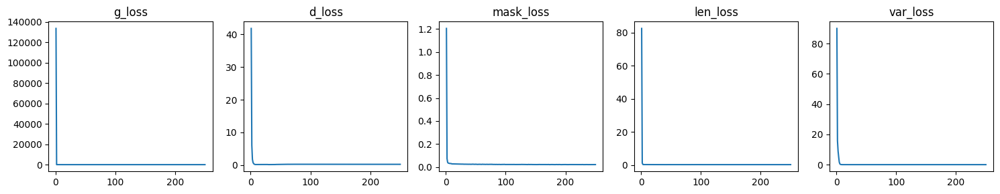

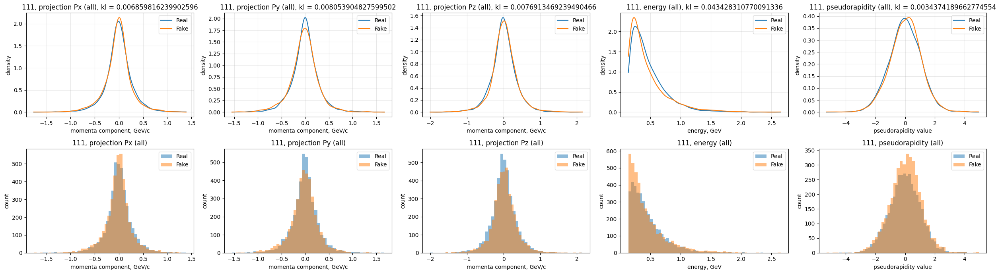

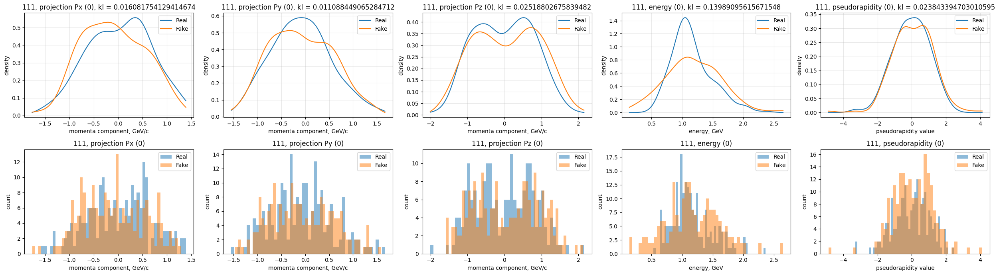

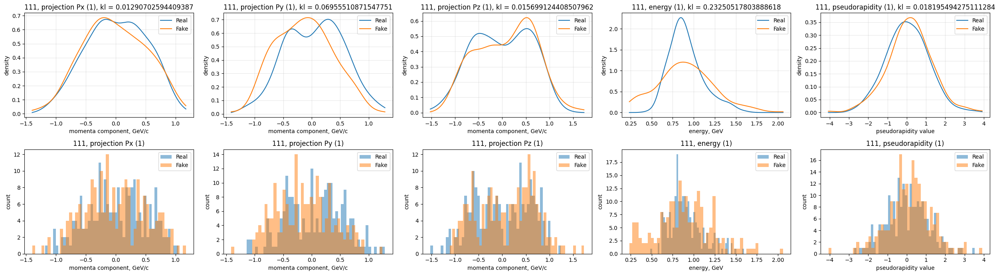

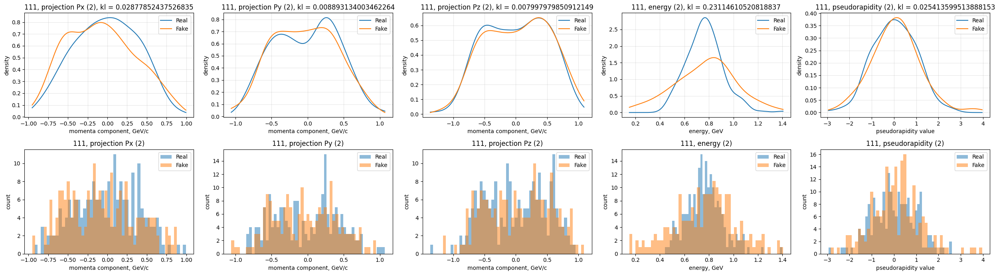

...

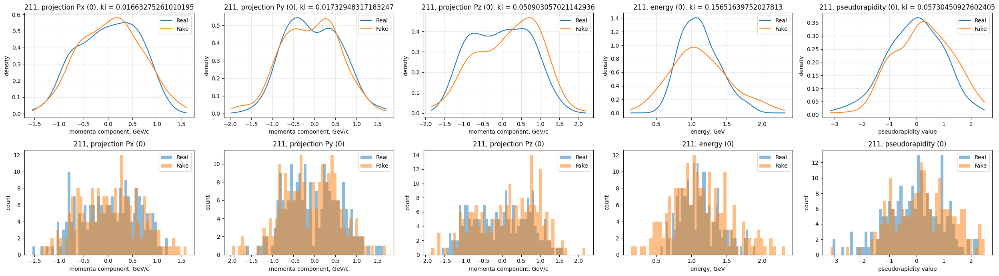

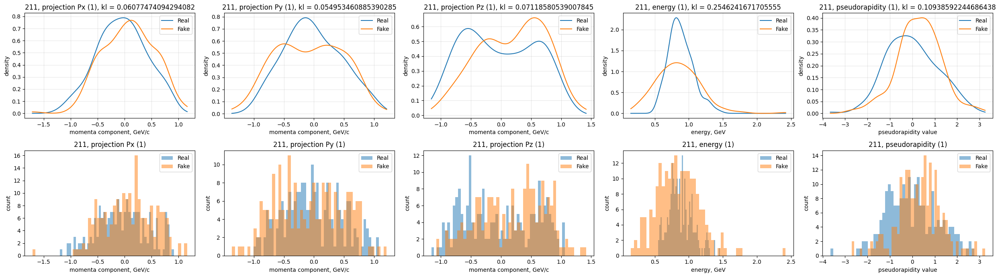

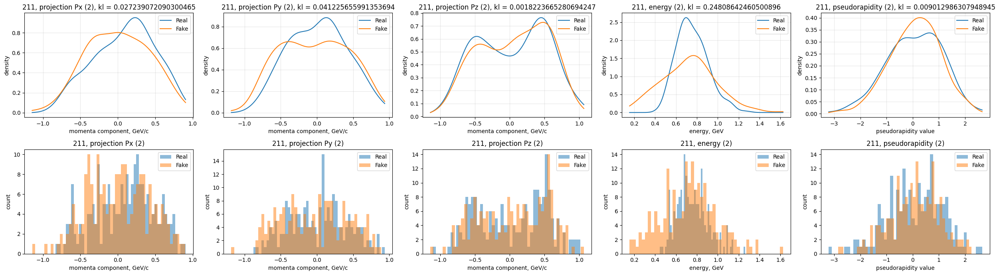

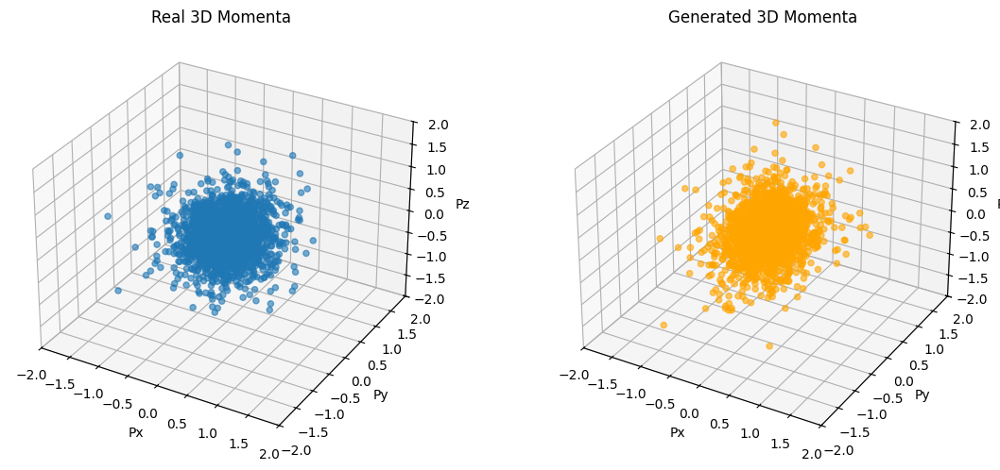

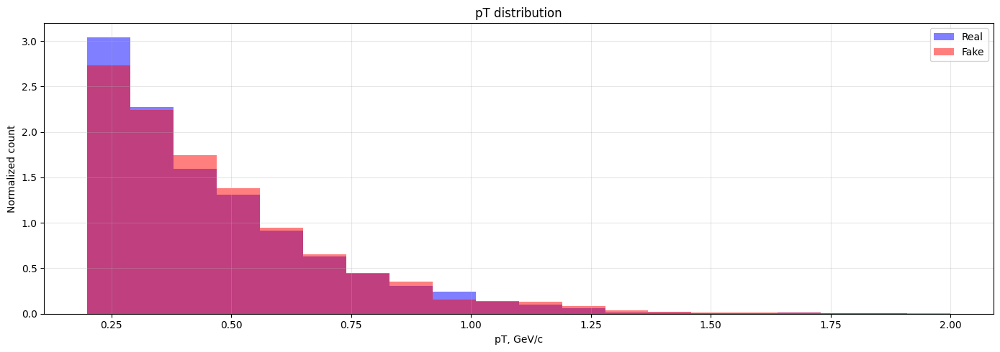

In [33]:
latent_dim = 32
latent_local_dim = 32
hid_dim = 64
num_classes = len(pions)
feat_dim = 3
num_equiv_layers_gen = 5
num_equiv_layers_disc = 5
epoch = 250
n_modes = 2
lr = 1e-4
extern_cond_d = len(cond_cols)
betas = (0.5, 0.999)

G = EPiC_Transformer_Generator(
    latent_global=latent_dim,
    latent_local=latent_local_dim,
    num_labels=num_classes,
    feats=feat_dim,
    max_len=meson_count_max,
    d_model=2*hid_dim,
    n_heads=8,
    extern_cond_d=extern_cond_d,
    d_ff=hid_dim,
    n_modes=n_modes,
    n_layers=num_equiv_layers_gen
).to(device)


D = EPiC_Transformer_Discriminator(
    num_labels=num_classes,
    feats=feat_dim,
    d_model=2*hid_dim,
    n_heads=8,
    d_ff=hid_dim,
    extern_cond_d=extern_cond_d,
    n_layers=num_equiv_layers_gen
).to(device)

opt_g = optim.Adam(G.parameters(), lr=lr, betas=betas)
opt_d = optim.Adam(D.parameters(), lr=lr, betas=betas)

train_(G,
       D,
       urqmd_train_dataloader,
       opt_g,
       opt_d,
       device,
       'lsgan',
       1,
       latent_dim,
       latent_local_dim,
       epoch,
       train_epoch) # 60-70 130-140 210?-220 250 (libo beta1=0.9?????)

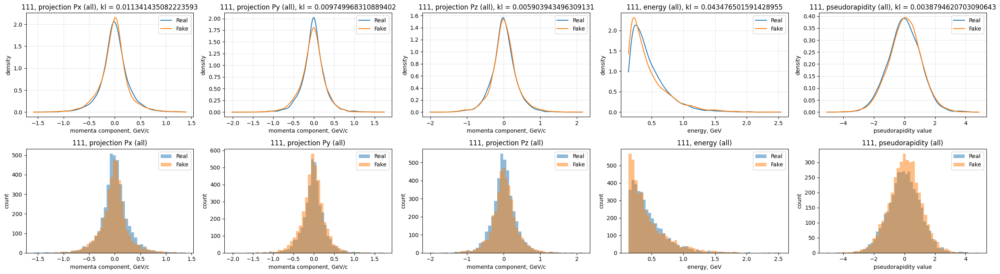

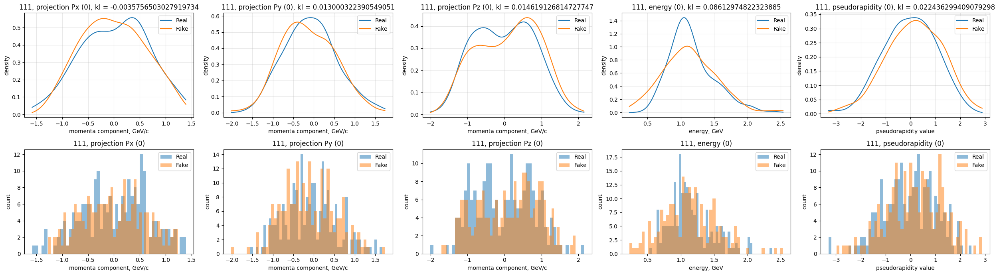

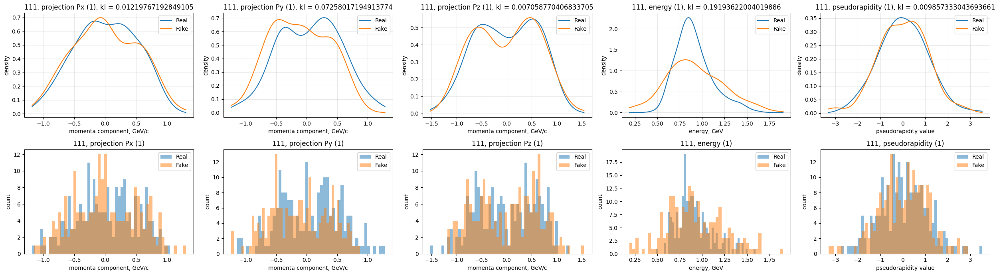

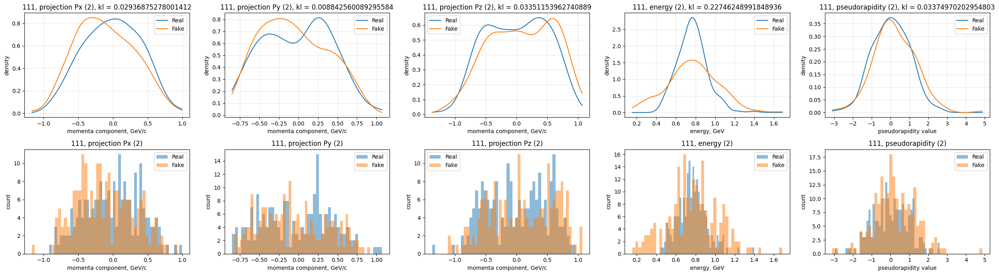

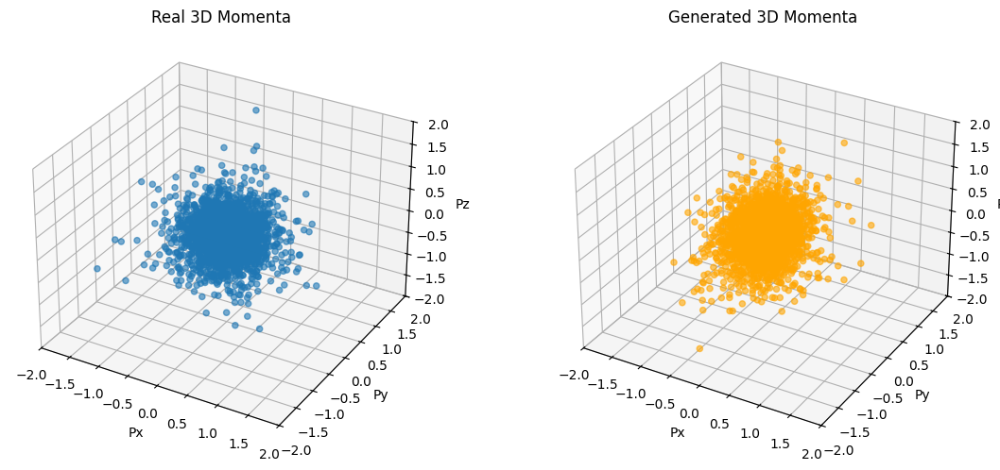

...

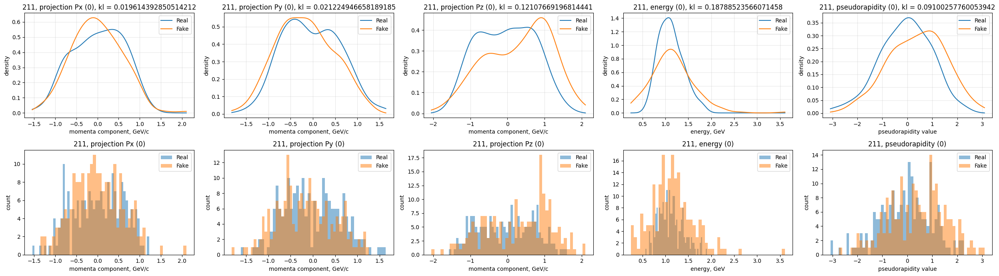

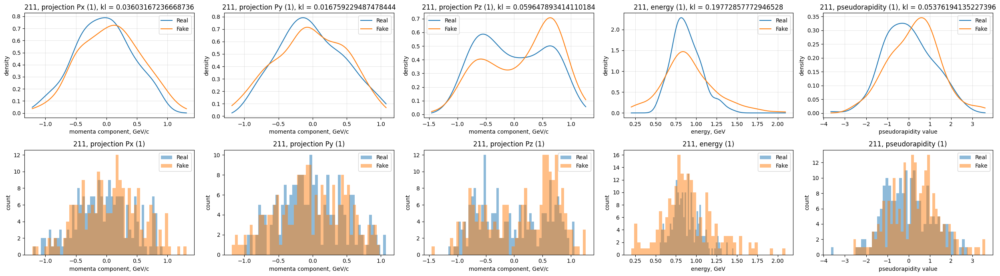

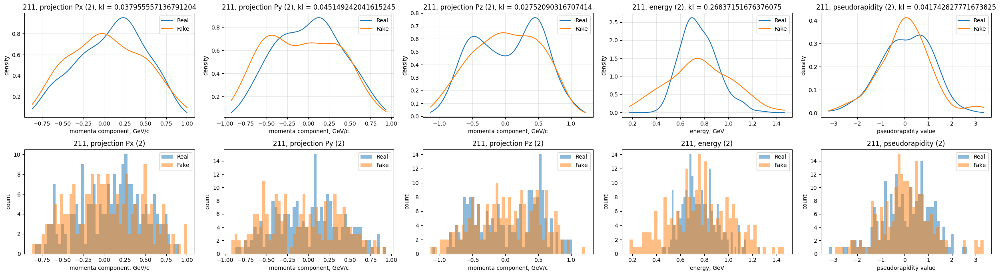

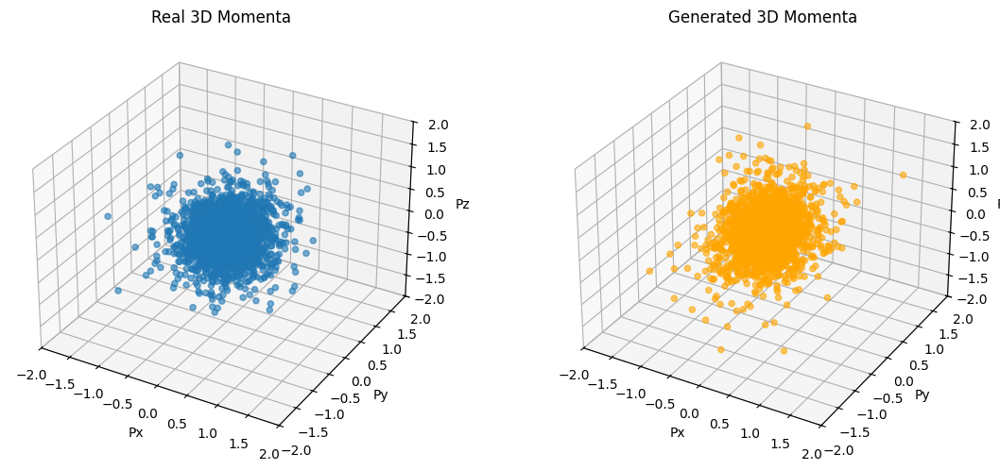

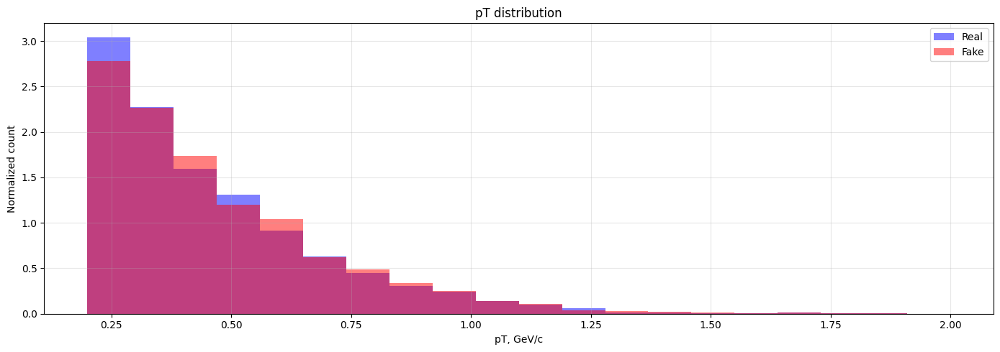

In [34]:
for i in range(len(num_to_label)):
    all_labels = torch.tensor(test_1_7_label)
    mask = all_labels == i
    if mask.sum() == 0:
        continue
    other_test = torch.tensor(test_1_7_mom, dtype=torch.float32)[mask]
    cond_test = torch.tensor(test_1_7_cond, dtype=torch.float32)[mask]
    label_test = all_labels[mask]
    mask_test = torch.tensor(test_1_7_mask, dtype=torch.float32)[mask]
    generated_other, _ = generate(G, mask_test.shape[0], mask_test.shape[1], latent_dim, latent_local_dim, cond_test, label_test, device)
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i])
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=0)
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=1)
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=2)
    plot_scatter(other_test, generated_other)
    plot_v2(other_test, generated_other)

In [ ]:
def count_pt(particles):
    '''
    расчет общей доли поперечного импульса частиц по типам
    '''
    pt_parts = {}
    sum_pt = 0
    for k, v in particles.items():
        pt = torch.sum(torch.sqrt(v[:, 0] ** 2 + v[:, 1] ** 2))
        sum_pt += pt
        pt_parts[k] = pt
    pt_parts = {k: (v / sum_pt).item() for k, v in pt_parts.items()}
    return pt_parts


def count_e(particles):
    '''
    расчет общей доли энергии частиц по типам (для реальный частиц, по данным из датасета)
    '''
    e_parts = {}
    sum_e = 0
    for k, v in particles.items():
        e = torch.sum(v[:, -1])
        sum_e += e
        e_parts[k] = e
    e_parts = {k: (v / sum_e).item() for k, v in e_parts.items()}
    return e_parts


def count_e_with_mass(particles):
    '''
    расчет общей доли энергии частиц по типам (для сгенерированных частиц)
    '''
    e_parts = {}
    sum_e = 0
    for k, v in particles.items():
        if k == 'protons' or k == 'neutrons':
            e = torch.sum(v[:, -1])
            sum_e += e
            e_parts[k] = e
        else:
            e = torch.sum(calc_energy(v[:, 0], v[:, 1], v[:, 2], torch.full_like(v[:, 0], pion_masses[k])))
            sum_e += e
            e_parts[k] = e
    e_parts = {k: (v / sum_e).item() for k, v in e_parts.items()}
    return e_parts


def plot_pt(real, fake, mode='pt'):
    real_keys = [str(k) for k in real.keys()]
    real_values = [np.mean(v) for v in real.values()]
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(real_keys, real_values, label='Real', alpha=0.5)
    fake_keys = [str(k) for k in fake.keys()]
    fake_values = [np.mean(v) for v in fake.values()]
    bars = ax.bar(fake_keys, fake_values, label='Fake', alpha=0.5)
    real_values = np.array(real_values)
    fake_values = np.array(fake_values)
    ratios = [f'{round(val, 2)}%' for val in (np.abs(real_values - fake_values) / real_values * 100)]
    ax.bar_label(bars, labels=ratios, padding=3)
    ax.set_xlabel('particle type')
    ax.set_ylabel('value')
    ax.set_title('Transverse momentum modulus fraction' if mode == 'pt' else 'Energy fraction')
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.legend()
    plt.show()

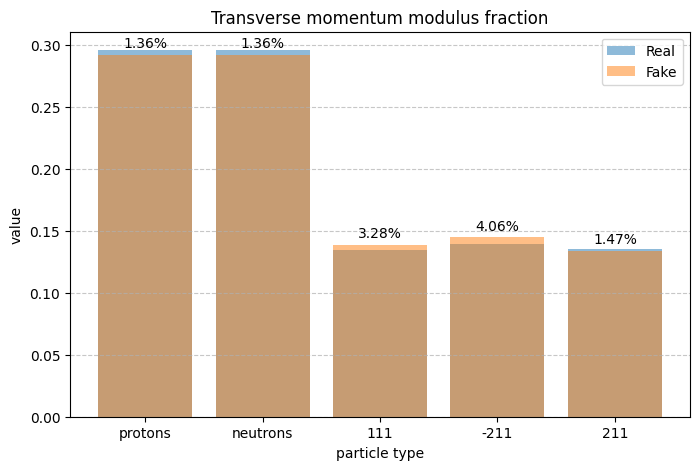

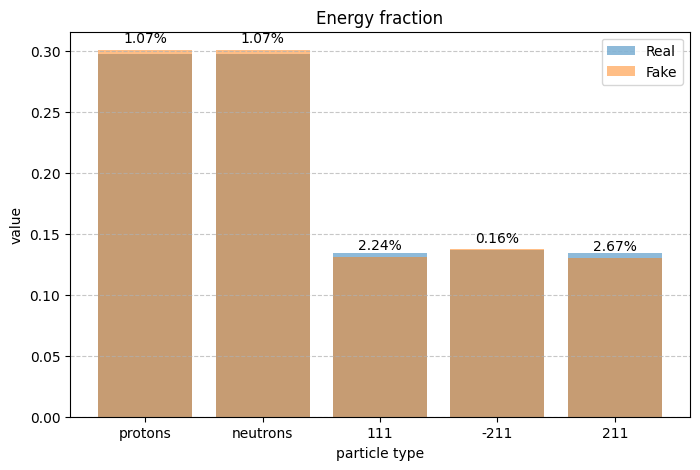

In [36]:
all_real_pt = {}
all_fake_pt = {}
all_real_e = {}
all_fake_e = {}
for i in np.unique(test_1_7_event):
    all_events = torch.tensor(test_1_7_event)
    mask = all_events == i
    if mask.sum() == 0:
        continue
    other_test = torch.tensor(test_1_7_mom, dtype=torch.float32)[mask]
    real = {}
    fake = {}
    nucl_1_test = torch.tensor([nucl[0] for nucl in test_1_7_nucl], dtype=torch.float32)[mask]
    nucl_2_test = torch.tensor([nucl[1] for nucl in test_1_7_nucl], dtype=torch.float32)[mask]
    nucl_1_test_mask = torch.tensor([nucl[0] for nucl in test_1_7_nucl_mask], dtype=torch.float32)[mask]
    nucl_2_test_mask = torch.tensor([nucl[1] for nucl in test_1_7_nucl_mask], dtype=torch.float32)[mask]
    real['protons'] = (nucl_1_test * nucl_1_test_mask.unsqueeze(-1))[0]
    real['neutrons'] = (nucl_2_test * nucl_2_test_mask.unsqueeze(-1))[0]
    fake['protons'] = (nucl_1_test * nucl_1_test_mask.unsqueeze(-1))[0]
    fake['neutrons'] = (nucl_2_test * nucl_2_test_mask.unsqueeze(-1))[0]
    label_test = all_labels[mask]
    mask_test = torch.tensor(test_1_7_mask, dtype=torch.float32)[mask]
    cond_test = torch.tensor(test_1_7_cond, dtype=torch.float32)[mask]
    generated_other, _ = generate(G, mask_test.shape[0], mask_test.shape[1], latent_dim, latent_local_dim, cond_test, label_test, device)
    for i in range(len(label_test)):
        real[num_to_label[label_test[i].item()]] = other_test[i]
        fake[num_to_label[label_test[i].item()]] = generated_other[i]
    real_pt = count_pt(real)
    fake_pt = count_pt(fake)
    real_e = count_e(real)
    fake_e = count_e_with_mass(fake)
    for k in real_pt.keys():
        if k in all_real_pt:
            all_real_pt[k].append(real_pt[k])
            all_fake_pt[k].append(fake_pt[k])
            all_real_e[k].append(real_e[k])
            all_fake_e[k].append(fake_e[k])
        else:
            all_real_pt[k] = [real_pt[k]]
            all_fake_pt[k] = [fake_pt[k]]
            all_real_e[k] = [real_e[k]]
            all_fake_e[k] = [fake_e[k]]

plot_pt(all_real_pt, all_fake_pt)
plot_pt(all_real_e, all_fake_e, mode='energy')

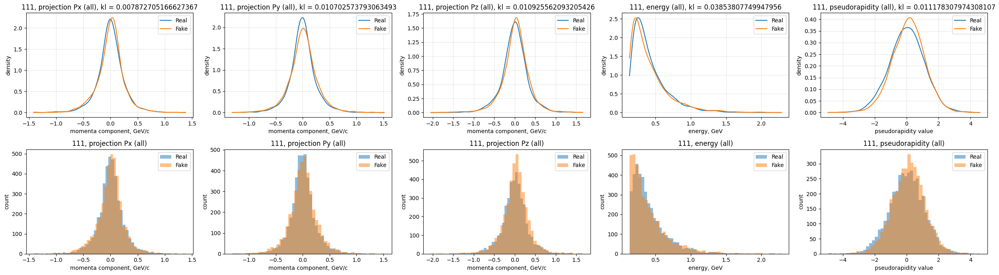

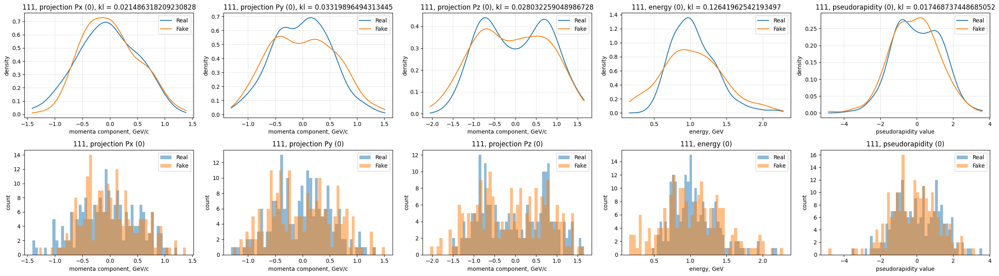

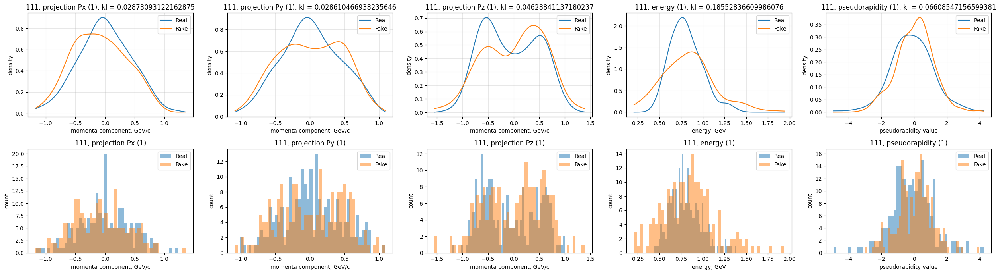

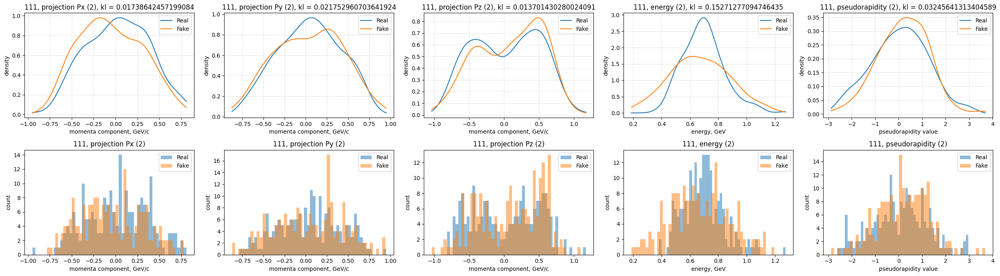

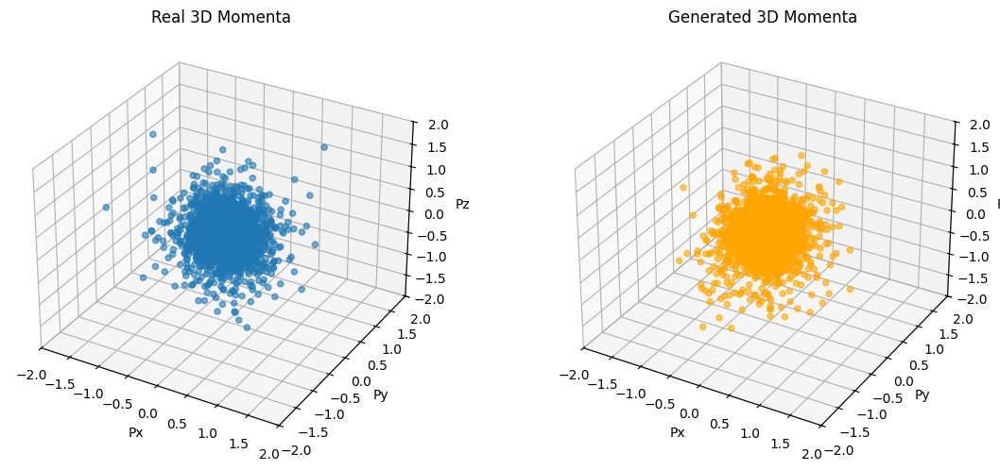

...

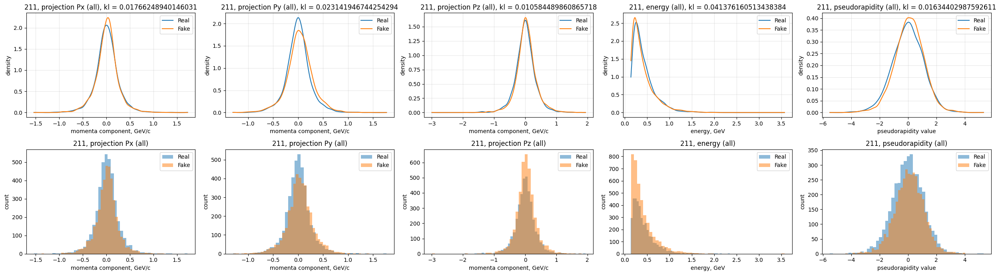

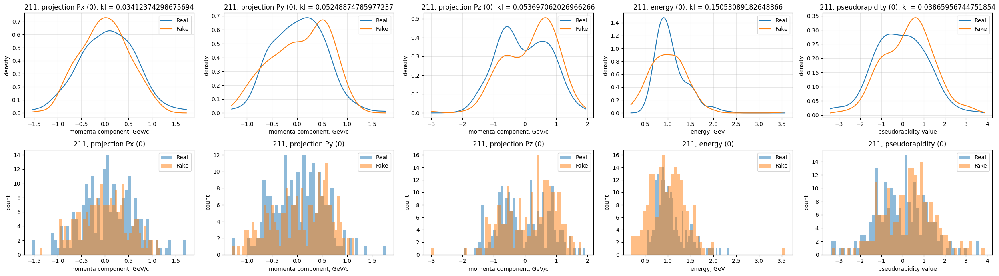

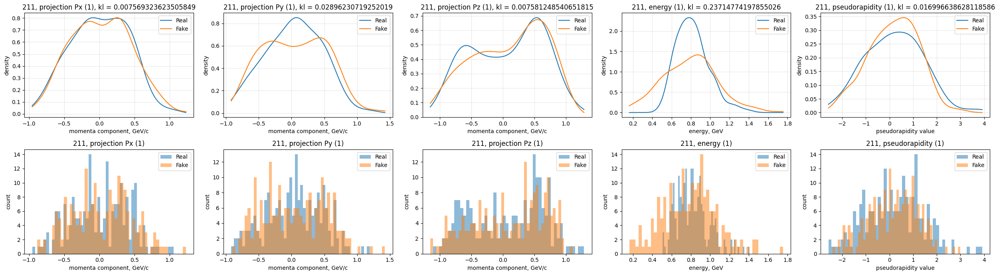

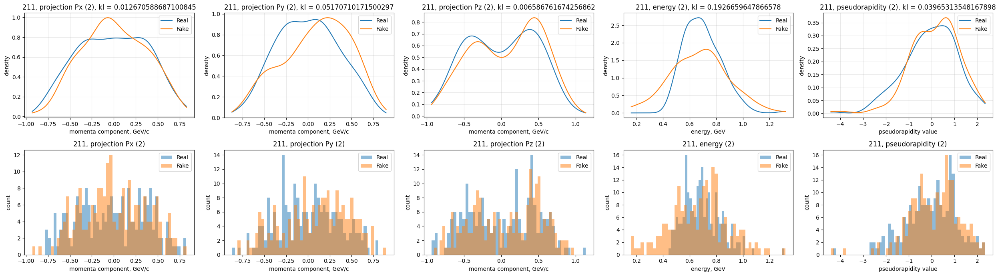

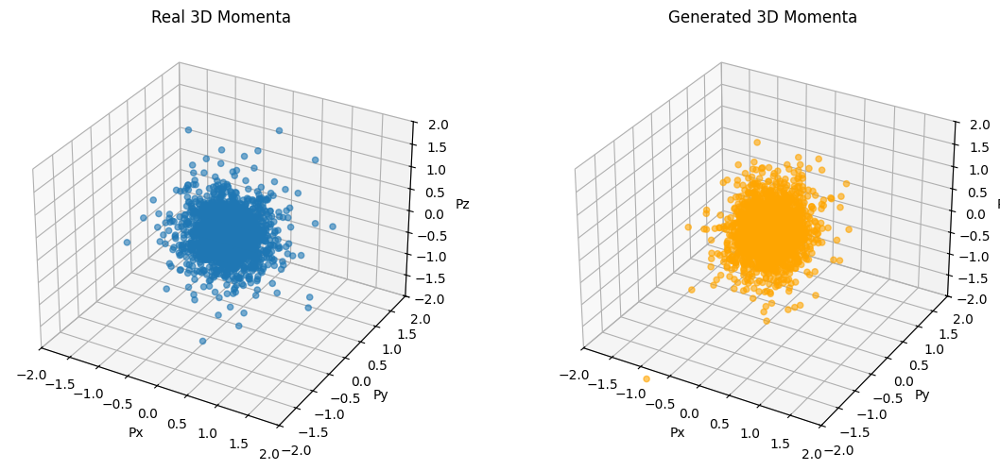

In [37]:
for i in range(len(num_to_label)):
    all_labels = torch.tensor(test_5_label)
    mask = all_labels == i
    if mask.sum() == 0:
        continue
    other_test = torch.tensor(test_5_mom, dtype=torch.float32)[mask]
    label_test = all_labels[mask]
    mask_test = torch.tensor(test_5_mask, dtype=torch.float32)[mask]
    cond_test = torch.tensor(test_5_cond, dtype=torch.float32)[mask]
    generated_other, _ = generate(G, mask_test.shape[0], mask_test.shape[1], latent_dim, latent_local_dim, cond_test, label_test, device)
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i])
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=0)
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=1)
    plot_kde(other_test, generated_other, ['Px', 'Py', 'Pz'], num_to_label[i], num=2)
    plot_scatter(other_test, generated_other)

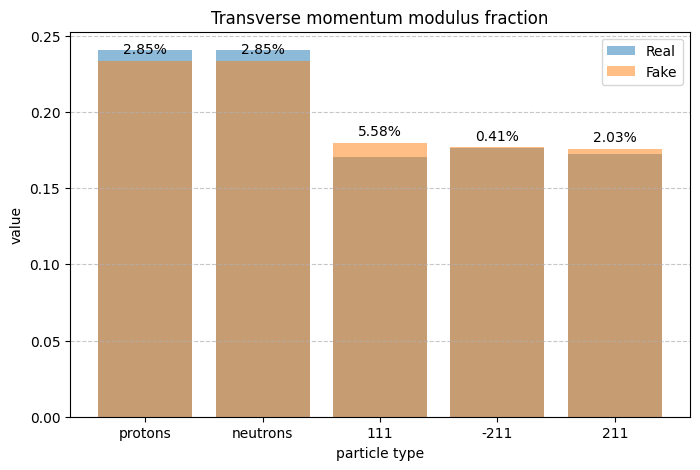

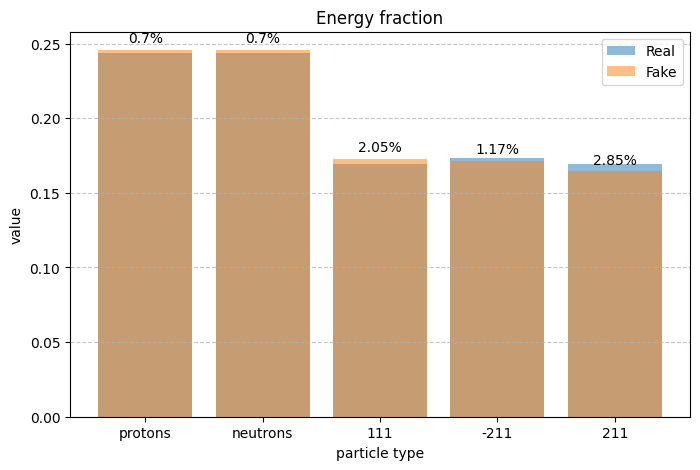

In [38]:
all_real_pt = {}
all_fake_pt = {}
all_real_e = {}
all_fake_e = {}
for i in np.unique(test_5_event):
    all_events = torch.tensor(test_5_event)
    mask = all_events == i
    if mask.sum() == 0:
        continue
    other_test = torch.tensor(test_5_mom, dtype=torch.float32)[mask]
    real = {}
    fake = {}
    nucl_1_test = torch.tensor([nucl[0] for nucl in test_5_nucl], dtype=torch.float32)[mask]
    nucl_2_test = torch.tensor([nucl[1] for nucl in test_5_nucl], dtype=torch.float32)[mask]
    nucl_1_test_mask = torch.tensor([nucl[0] for nucl in test_5_nucl_mask], dtype=torch.float32)[mask]
    nucl_2_test_mask = torch.tensor([nucl[1] for nucl in test_5_nucl_mask], dtype=torch.float32)[mask]
    real['protons'] = (nucl_1_test * nucl_1_test_mask.unsqueeze(-1))[0]
    real['neutrons'] = (nucl_2_test * nucl_2_test_mask.unsqueeze(-1))[0]
    fake['protons'] = (nucl_1_test * nucl_1_test_mask.unsqueeze(-1))[0]
    fake['neutrons'] = (nucl_2_test * nucl_2_test_mask.unsqueeze(-1))[0]
    label_test = all_labels[mask]
    mask_test = torch.tensor(test_5_mask, dtype=torch.float32)[mask]
    cond_test = torch.tensor(test_5_cond, dtype=torch.float32)[mask]
    generated_other, _ = generate(G, mask_test.shape[0], mask_test.shape[1], latent_dim, latent_local_dim, cond_test, label_test, device)
    for i in range(len(label_test)):
        real[num_to_label[label_test[i].item()]] = other_test[i]
        fake[num_to_label[label_test[i].item()]] = generated_other[i]
    real_pt = count_pt(real)
    fake_pt = count_pt(fake)
    real_e = count_e(real)
    fake_e = count_e_with_mass(fake)
    for k in real_pt.keys():
        if k in all_real_pt:
            all_real_pt[k].append(real_pt[k])
            all_fake_pt[k].append(fake_pt[k])
            all_real_e[k].append(real_e[k])
            all_fake_e[k].append(fake_e[k])
        else:
            all_real_pt[k] = [real_pt[k]]
            all_fake_pt[k] = [fake_pt[k]]
            all_real_e[k] = [real_e[k]]
            all_fake_e[k] = [fake_e[k]]

plot_pt(all_real_pt, all_fake_pt)
plot_pt(all_real_e, all_fake_e, mode='energy')